In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import lightgbm as lgb

In [2]:
# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"

In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [4]:
train = pd.read_csv('train.csv')
test = pd.read_csv('data_for_test.csv')
# # both patient_id and key are different

In [5]:
print(train.shape)
print(train.drop_duplicates().shape)

(1348470, 17)
(1294038, 17)


In [6]:
print(test.shape)
print(test.drop_duplicates().shape)

(390570, 15)
(369864, 15)


In [8]:
train.head()

,patient_id,key,gender,age,x1,x2,x3,x4,x5,x6,xx1,xx2,xx3,xx4,xx5,y_mean_MAP,y_mean_HR
0,1891,1891-3,1,75,22,1,2,0,0,1,80.0,95.0,99.9,49.4,62.5,59.04,80.0
1,1891,1891-3,1,75,22,1,2,0,0,1,80.0,94.9,98.4,48.7,61.3,59.04,80.0
2,1891,1891-3,1,75,22,1,2,0,0,1,80.0,95.0,95.3,48.5,60.3,59.04,80.0
3,1891,1891-3,1,75,22,1,2,0,0,1,80.0,95.0,97.4,48.9,61.3,59.04,80.0
4,1891,1891-3,1,75,22,1,2,0,0,1,76.7,95.7,99.6,50.2,62.8,59.04,80.0


In [9]:
np.corrcoef(train.y_mean_MAP, train.y_mean_HR)

array([[1.        , 0.09927212],
       [0.09927212, 1.        ]])

In [ ]:
plt.scatter(train.y_mean_MAP, train.y_mean_HR)
plt.show()            

In [60]:
print(train.shape)
print(train.iloc[:, 1:6].drop_duplicates().shape)
print(train.iloc[:, :7].drop_duplicates().shape)
print(train.iloc[:, :10].drop_duplicates().shape)
len(train.key.unique())
# for unique key, the first 10 columns are the same.

(1348470, 18)
(44949, 5)
(44949, 7)
(44949, 10)


44949

In [9]:
def easy_expand(df):
    expand = df[['xx1', 'xx2', 'xx3', 'xx4', 'xx5']]
    expand_final = pd.DataFrame(expand.values.flatten().reshape(-1,150)).\
                reset_index().drop(columns = 'index')
    df1 = df[['patient_id', 'key', 'gender', 'age', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6',
               ]].drop_duplicates().reset_index().drop(columns = 'index')
    df2_final = pd.concat([df1, expand_final], axis = 1)
    return df2_final

In [10]:
print(easy_expand(train).
      drop(columns = ['patient_id', 'key']).drop_duplicates().shape)
print(easy_expand(train).shape)

(44949, 158)
(44949, 160)


In [12]:
# key which values are not unique
test1 = easy_expand(test)
duplicate_key_all = \
test1.loc[test1.drop(columns = ['patient_id', 'key']).duplicated().values].key.unique()

In [13]:
(test.patient_id.value_counts()/30 == 50).index
# test.loc[test.patient_id.value_counts()/30 == 50,:]

Int64Index([1851,  769, 2560, 1232, 1336, 1883,  648, 1365, 2227,  422,
            ...
            1268, 1987,  963, 1218, 1644, 1307,  383,  570, 1106, 1400], dtype='int64', length=558)

In [14]:
# np.unique([i.split('-')[0] for i in duplicate_key_all])

In [15]:
temp = test.groupby('patient_id').count().reset_index()
patient_id = temp.loc[temp.key == 1500][['patient_id']]

In [16]:
(test.patient_id.value_counts()/30 == 50).index
# test.loc[test.patient_id.value_counts()/30 == 50,:]

Int64Index([1851,  769, 2560, 1232, 1336, 1883,  648, 1365, 2227,  422,
            ...
            1268, 1987,  963, 1218, 1644, 1307,  383,  570, 1106, 1400], dtype='int64', length=558)

#### All the duplicated columns are not in the 50 observation patient_id? Strange

In [17]:
np.intersect1d(np.unique(patient_id.values), np.unique([i.split('-')[0] for i in duplicate_key_all]))

array([], dtype='<U21')

In [18]:
duplicate_key_50 = test.loc[test.patient_id.isin(patient_id.patient_id)].key.unique()

In [19]:
np.intersect1d(duplicate_key_50, duplicate_key_all, return_indices=True)

(array([], dtype=object), array([], dtype=int64), array([], dtype=int64))

In [20]:
# unique patient id in the test set
test1.loc[test1.drop(columns = ['patient_id', 'key']).\
          drop_duplicates().index].patient_id.unique()

array([1005, 1007, 1025, 1026, 1028,  103, 1032, 1034, 1039,  104, 1044,
       1047, 1050, 1061, 1066,  108, 1086, 1103, 1106, 1108, 1116, 1119,
       1128, 1130, 1132, 1135, 1140, 1148,  115, 1155, 1161, 1167, 1176,
       1178, 1182, 1187, 1188, 1192, 1197, 1217, 1218, 1221, 1222, 1228,
       1232, 1239, 1245, 1246, 1253, 1254,  126, 1264, 1267, 1268, 1271,
       1274, 1276, 1282, 1295, 1299, 1306, 1307, 1308,  131, 1324, 1328,
        133, 1332, 1334, 1336, 1343, 1346, 1362, 1365, 1369,  137, 1374,
       1378, 1379, 1382, 1383, 1389, 1394, 1397, 1398,  140, 1400, 1403,
       1415, 1421, 1426, 1436, 1437, 1439, 1442, 1447,  145, 1453, 1455,
       1457, 1469, 1472, 1481, 1486, 1489, 1492, 1494, 1497, 1499, 1506,
       1510, 1511, 1512, 1516,  152, 1522, 1531, 1534,  154, 1546, 1548,
       1550,  156, 1560, 1565, 1574, 1575, 1578,  160,  161, 1612, 1614,
       1620, 1622, 1624, 1636, 1640, 1641, 1644,  165, 1651, 1653, 1655,
        166, 1662, 1665, 1673, 1676, 1680, 1684, 16

In [21]:
print(len(duplicate_key_50))
print(len(duplicate_key_all))

3150
4653


In [22]:
print(easy_expand(test).drop(columns = ['patient_id', 'key']).drop_duplicates().shape)
print(easy_expand(test).drop(columns = ['patient_id', 'key']).shape)

(8366, 158)
(13019, 158)


In [23]:
train.head()
train.key.value_counts().unique()
# train.info()

array([30])

In [24]:
train.patient_id.value_counts()/30

1097    198.0
698     194.0
1931    194.0
158     192.0
2792    191.0
        ...  
535       1.0
2584      1.0
2592      1.0
1573      1.0
0         1.0
Name: patient_id, Length: 2321, dtype: float64

In [25]:
# in test set there are 63 patient who has 50 unique keys.

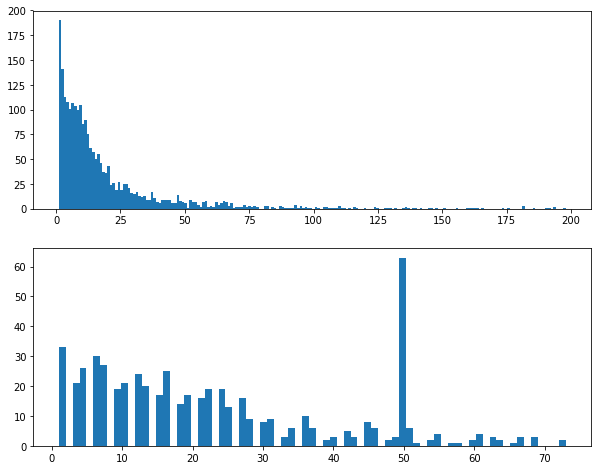

In [11]:
fig, ax = plt.subplots(nrows=2, sharex=False, sharey=False, figsize=(10,8))
ax[0].hist(train.patient_id.value_counts().values/30, bins = 198) # how many unique key in patient_id
ax[1].hist(test.patient_id.value_counts().values/30, bins = 73)
plt.show()
# the test set ends in 73, with most patients have 50 unique key set. the train and tes set has different distribution

In [17]:
max(test.patient_id.value_counts()/30)

73.0

In [27]:
# contract to train_set:
temp1 = train.groupby('patient_id').agg({'key':'count'}).reset_index()
temp1 = train[train.patient_id.isin(temp1.loc[temp1.key == 1500].patient_id)]
temp1.head()

,patient_id,key,gender,age,x1,x2,x3,x4,x5,x6,xx1,xx2,xx3,xx4,xx5,y_mean_MAP,y_mean_HR
21060,2519,2519-5,1,81,30,5,2,0,0,1,88.0,94.7,112.8,43.3,65.7,73.46,88.24
21061,2519,2519-5,1,81,30,5,2,0,0,1,88.2,95.0,108.5,41.9,63.4,73.46,88.24
21062,2519,2519-5,1,81,30,5,2,0,0,1,88.3,95.5,106.9,41.5,62.2,73.46,88.24
21063,2519,2519-5,1,81,30,5,2,0,0,1,88.1,95.8,110.3,42.6,64.3,73.46,88.24
21064,2519,2519-5,1,81,30,5,2,0,0,1,88.0,95.5,111.7,43.8,66.1,73.46,88.24


In [28]:
train[train.xx2 == 0]

,patient_id,key,gender,age,x1,x2,x3,x4,x5,x6,xx1,xx2,xx3,xx4,xx5,y_mean_MAP,y_mean_HR
390,2410,2410-12,0,47,21,3,2,1,0,1,98.6,0.0,127.0,76.2,92.7,88.50,94.06
391,2410,2410-12,0,47,21,3,2,1,0,1,100.5,0.0,125.5,76.6,92.6,88.50,94.06
392,2410,2410-12,0,47,21,3,2,1,0,1,99.5,0.0,126.1,76.4,92.6,88.50,94.06
393,2410,2410-12,0,47,21,3,2,1,0,1,98.2,0.0,127.6,76.2,92.8,88.50,94.06
394,2410,2410-12,0,47,21,3,2,1,0,1,97.6,0.0,127.3,75.5,92.2,88.50,94.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
540579,2573,2573-85,1,62,42,4,1,0,0,0,104.9,0.0,133.4,68.3,94.6,67.64,107.22
540580,2573,2573-85,1,62,42,4,1,0,0,0,102.8,0.0,139.0,68.5,96.3,67.64,107.22
540581,2573,2573-85,1,62,42,4,1,0,0,0,109.1,0.0,144.1,71.0,100.5,67.64,107.22
540582,2573,2573-85,1,62,42,4,1,0,0,0,111.4,0.0,150.0,72.6,103.7,67.64,107.22


In [2]:
# train[train.xx2 == 0].groupby('patient_id').agg({'gender':'count'})

In [30]:
patient_list = temp1.patient_id.unique()

In [31]:
temp = test.groupby('patient_id').agg({'key':'count'}).reset_index()
hint = test[test.patient_id.isin(temp.loc[temp.key == 1500].patient_id)]
hint

,patient_id,key,gender,age,x1,x2,x3,x4,x5,x6,xx1,xx2,xx3,xx4,xx5
1860,1026,1026-1,1,71,43,11,3,0,1,1,98.667,99.817,99.853,38.234,58.816
1861,1026,1026-1,1,71,43,11,3,0,1,1,98.900,100.000,96.869,38.067,57.831
1862,1026,1026-1,1,71,43,11,3,0,1,1,98.517,99.967,91.533,35.367,54.182
1863,1026,1026-1,1,71,43,11,3,0,1,1,98.400,99.817,91.501,35.851,54.629
1864,1026,1026-1,1,71,43,11,3,0,1,1,97.283,99.833,90.002,33.984,53.115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
389185,980,980-50,0,67,36,6,6,0,0,0,108.668,100.000,146.333,76.100,101.153
389186,980,980-50,0,67,36,6,6,0,0,0,108.267,100.000,144.100,75.300,99.485
389187,980,980-50,0,67,36,6,6,0,0,0,106.600,100.000,142.665,74.249,98.617
389188,980,980-50,0,67,36,6,6,0,0,0,106.201,100.000,138.817,72.650,96.133


In [33]:
# sorted((np.unique(hint.key.str.split('-', expand=True).iloc[:,1]).astype(int)))

# continous period: 1 - 50

In [34]:
hint.loc[(hint.x3 == 3) & (hint.x1 < 45) & (hint.x1 > 40)]['x2'].unique()

array([11,  7,  4,  3])

In [35]:
len(hint.patient_id.unique())

63

In [ ]:
fig, ax = plt.subplots(nrows=len(columns),
                       ncols=2, sharex=False, sharey=False, figsize=(15,50))
for i in range(len(columns)):
    sns.scatterplot(train[columns[i]].values, train['y_mean_MAP'],
                     color="b", ax=ax[i][0])
    sns.scatterplot(train[columns[i]].values, train['y_mean_HR'],
                     color='r', ax=ax[i][1])
    ax[i][0].set_xlabel(columns[i])
    ax[i][1].set_xlabel(columns[i])
plt.show()

In [ ]:
sns.lineplot(x='num', y='y_mean_HR', 
                 data=train1[train1.patient_id == patient_list[i]], ax=ax[i][1])
    sns.scatterplot(x='num', y='y_mean_MAP', 
                    data=train1[train1.patient_id == patient_list[i]], ax=ax[i][0])

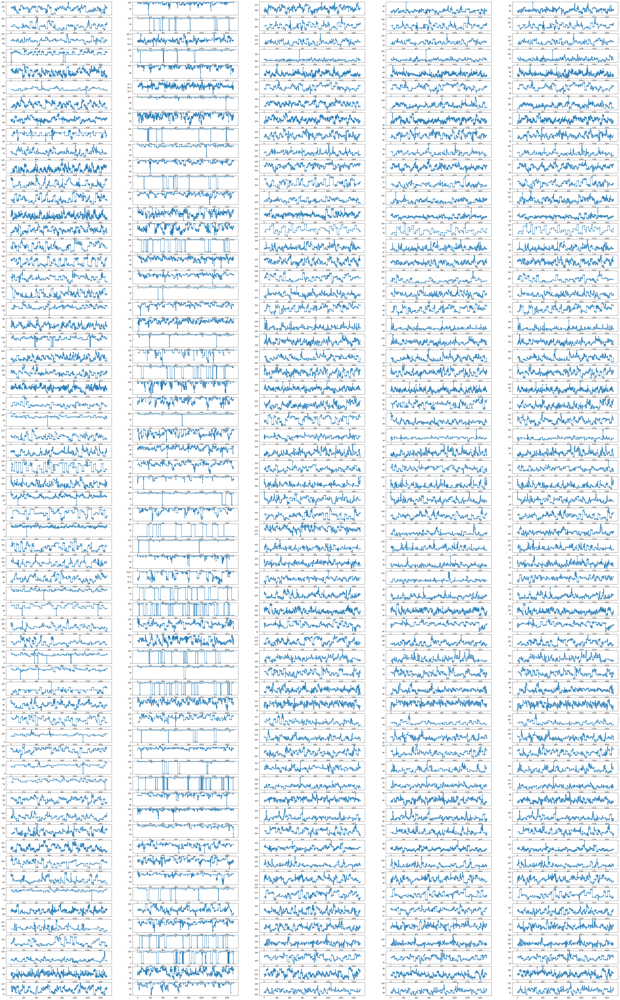

In [139]:
col_list = ['xx1', 'xx2', 'xx3', 'xx4', 'xx5']
patiend_list = hint.patient_id.unique()
fig, ax = plt.subplots(nrows=len(patiend_list),
                       ncols=5, sharex=False, sharey=False, figsize=(60,150))
for i in range(len(patiend_list)):
    for j in range(5):
        series = hint.loc[hint.patient_id == patiend_list[i]][col_list[j]]
        sns.scatterplot(range(len(series)), series.values, ax =ax[i][j])
        sns.lineplot(range(len(series)), series.values, ax =ax[i][j])

In [154]:
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5, forward=True)
# fig

<Figure size 1332x756 with 0 Axes>

In [86]:
# hint.patient_id.value_counts()

In [96]:
temp1 = hint.groupby('key').agg({'xx1':'mean', 'xx2':'mean',
                                'xx3':'mean','xx4':'mean', 'xx5':'mean'}).reset_index()
temp1['num'] = temp1['key'].str.split('-', expand=True).iloc[:,1]
temp1['key'] = temp1['key'].str.split('-', expand=True).iloc[:,0]
temp1['key'] = temp1['key'].astype(int)
temp1['num'] = temp1['num'].astype(int)
temp1 = temp1.sort_values(by = ['key', 'num'])
temp1

,key,xx1,xx2,xx3,xx4,xx5,num
2000,45,95.689167,95.775467,129.125233,65.391700,85.094533,1
2011,45,81.126833,97.302267,166.108600,65.710033,93.865533,2
2022,45,88.204467,96.725567,142.066933,60.916267,81.923800,3
2033,45,96.855167,95.851133,120.365467,66.119067,82.875033,4
2044,45,95.690767,96.382333,118.348533,60.646733,77.147000,5
...,...,...,...,...,...,...,...
1940,2837,103.880000,22.406667,143.630000,75.193333,95.586667,46
1941,2837,69.003333,0.000000,112.726667,52.540000,71.656667,47
1942,2837,104.063333,35.133333,161.263333,81.396667,105.136667,48
1943,2837,77.836667,0.000000,159.206667,71.906667,99.266667,49


In [107]:
fig.savefig('temp1.png')

In [95]:
# temp1.key.value_counts() are all 50

### Plot

In [138]:
# plot all the patients in the test set with 50 unique keys with mean xx1 - xx5
col_list = ['xx1', 'xx2', 'xx3', 'xx4', 'xx5']
patiend_list = temp1.key.unique()
fig, ax = plt.subplots(nrows=len(patiend_list),
                       ncols=5, sharex=False, sharey=False, figsize=(100,600))
for i in range(len(patiend_list)):
    for j in range(5):
        series = temp1.loc[temp1.key == patiend_list[i]][col_list[j]]
        sns.scatterplot(range(len(series)), series.values, ax =ax[i][j])
        sns.lineplot(range(len(series)), series.values, ax =ax[i][j])  

In [4]:
# # plot all the patients in the test set with 50 unique keys with xx1 - xx5 day 30
# col_list = ['xx1', 'xx2', 'xx3', 'xx4', 'xx5']
# patiend_list = temp1.key.unique()
# fig, ax = plt.subplots(nrows=len(patiend_list),
#                        ncols=5, sharex=False, sharey=False, figsize=(100,600))
# for i in range(len(patiend_list)):
#     for j in range(5):
#         series = temp1.loc[temp1.key == patiend_list[i]][col_list[j]]
#         sns.scatterplot(range(len(series)), series.values, ax =ax[i][j])
#         sns.lineplot(range(len(series)), series.values, ax =ax[i][j])  

[]

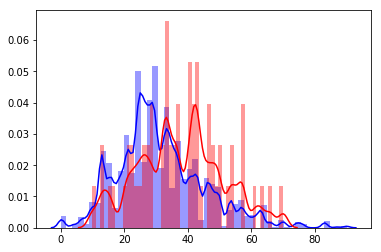

In [36]:
sns.distplot(test['x1'].values, kde=True, color="b")
sns.distplot(hint['x1'].values, kde=True, color='r')
plt.plot()

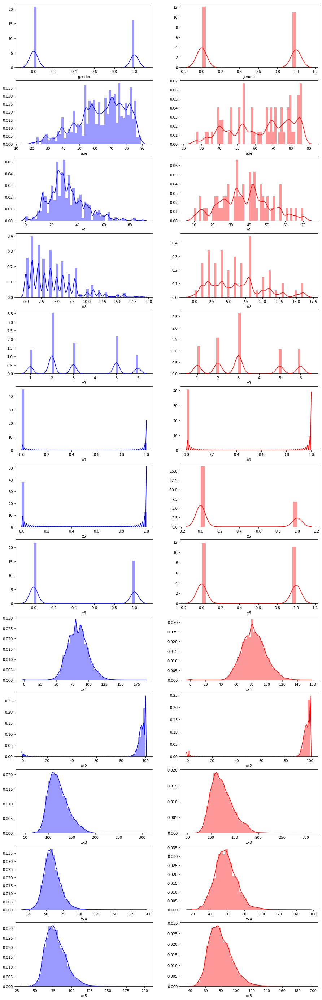

In [37]:
columns = list(hint.columns)
columns.remove('patient_id')
columns.remove('key')
fig, ax = plt.subplots(nrows=len(columns),
                       ncols=2, sharex=False, sharey=False, figsize=(15,50))
for i in range(len(columns)):
    sns.distplot(test[columns[i]].values, kde=True, color="b", ax=ax[i][0])
    sns.distplot(hint[columns[i]].values, kde=True, color='r', ax=ax[i][1])
    ax[i][0].set_xlabel(columns[i])
    ax[i][1].set_xlabel(columns[i])
plt.show()

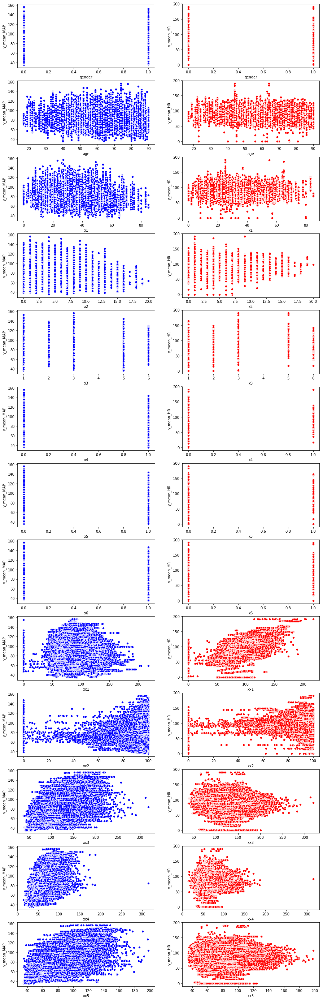

In [38]:
fig, ax = plt.subplots(nrows=len(columns),
                       ncols=2, sharex=False, sharey=False, figsize=(15,50))
for i in range(len(columns)):
    sns.scatterplot(train[columns[i]].values, train['y_mean_MAP'],
                     color="b", ax=ax[i][0])
    sns.scatterplot(train[columns[i]].values, train['y_mean_HR'],
                     color='r', ax=ax[i][1])
    ax[i][0].set_xlabel(columns[i])
    ax[i][1].set_xlabel(columns[i])
plt.show()

###  1. Change the discrete index to the continuous in the training data ()
###  2. 

In [39]:
test.head()
test.key.value_counts().unique()

array([30])

###  EDA towards destribution of training & test set

In [40]:
# test.patient_id.value_counts()[test.patient_id.value_counts().values > 1000]

In [41]:
train.head()

,patient_id,key,gender,age,x1,x2,x3,x4,x5,x6,xx1,xx2,xx3,xx4,xx5,y_mean_MAP,y_mean_HR
0,1891,1891-3,1,75,22,1,2,0,0,1,80.0,95.0,99.9,49.4,62.5,59.04,80.0
1,1891,1891-3,1,75,22,1,2,0,0,1,80.0,94.9,98.4,48.7,61.3,59.04,80.0
2,1891,1891-3,1,75,22,1,2,0,0,1,80.0,95.0,95.3,48.5,60.3,59.04,80.0
3,1891,1891-3,1,75,22,1,2,0,0,1,80.0,95.0,97.4,48.9,61.3,59.04,80.0
4,1891,1891-3,1,75,22,1,2,0,0,1,76.7,95.7,99.6,50.2,62.8,59.04,80.0


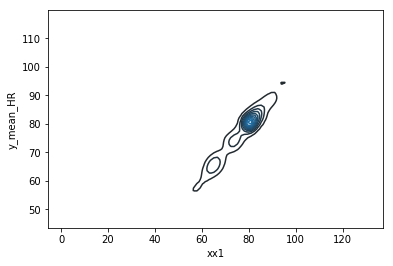

In [42]:
sns.kdeplot(train[:10000].xx1, train[:10000].y_mean_HR)

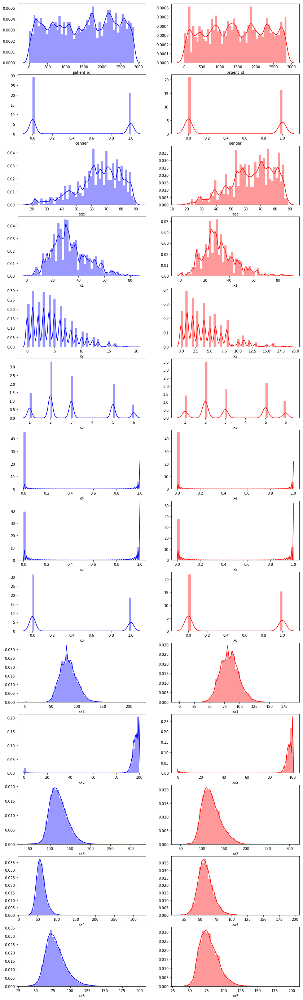

In [43]:
columns = list(train.columns)
columns.remove('key')
columns.remove('y_mean_MAP')
columns.remove('y_mean_HR')

fig, ax = plt.subplots(nrows=len(columns), 
                       ncols=2, sharex=False, sharey=False, figsize=(14,50))
for i in range(len(columns)):
    sns.distplot(train[columns[i]].values, kde=True, color="b", 
                 ax=ax[i][0], axlabel = columns[i])
    sns.distplot(test[columns[i]].values, kde=True, color='r',
                 ax=ax[i][1], axlabel = columns[i])

plt.show()
# the distribution is almost the same

In [44]:
train.describe()

,patient_id,gender,age,x1,x2,x3,x4,x5,x6,xx1,xx2,xx3,xx4,xx5,y_mean_MAP,y_mean_HR
count,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06,1.348470e+06
mean,1.469837e+03,4.175176e-01,6.479960e+01,3.332670e+01,4.822577e+00,3.012303e+00,1.043850e-01,2.163563e-01,3.732230e-01,8.338725e+01,9.314891e+01,1.213985e+02,5.898525e+01,7.894375e+01,7.909662e+01,8.344642e+01
std,8.372619e+02,4.931499e-01,1.505399e+01,1.396050e+01,3.686292e+00,1.556848e+00,3.057594e-01,4.117601e-01,4.836608e-01,1.631827e+01,1.865803e+01,2.164184e+01,1.212996e+01,1.447734e+01,1.432882e+01,1.606510e+01
min,0.000000e+00,0.000000e+00,1.700000e+01,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.810000e+01,1.500000e+01,3.500000e+01,3.534333e+01,0.000000e+00
25%,7.240000e+02,0.000000e+00,5.700000e+01,2.400000e+01,2.000000e+00,2.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,7.200000e+01,9.500000e+01,1.060000e+02,5.080000e+01,6.896600e+01,6.905640e+01,7.209700e+01
50%,1.539000e+03,0.000000e+00,6.700000e+01,3.100000e+01,4.000000e+00,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,8.200000e+01,9.700000e+01,1.190000e+02,5.773400e+01,7.700000e+01,7.700000e+01,8.212020e+01
75%,2.201000e+03,1.000000e+00,7.700000e+01,4.200000e+01,7.000000e+00,5.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,9.356700e+01,9.900000e+01,1.348000e+02,6.579900e+01,8.700000e+01,8.718000e+01,9.346000e+01
max,2.878000e+03,1.000000e+00,9.000000e+01,8.500000e+01,2.000000e+01,6.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,2.180000e+02,1.000000e+02,3.190000e+02,3.150000e+02,1.981010e+02,1.564562e+02,1.900333e+02


In [45]:
test.describe()

,patient_id,gender,age,x1,x2,x3,x4,x5,x6,xx1,xx2,xx3,xx4,xx5
count,390570.000000,390570.000000,390570.000000,390570.000000,390570.000000,390570.000000,390570.000000,390570.000000,390570.000000,390570.000000,390570.000000,390570.000000,390570.000000,390570.000000
mean,1464.580459,0.436439,63.977571,31.559951,4.443506,3.127506,0.104309,0.244182,0.412397,83.552863,94.728815,121.028862,58.948392,78.705601
std,822.226045,0.495944,14.977077,13.843053,3.657526,1.654793,0.305661,0.429601,0.492267,15.339491,14.843257,21.044002,12.277422,13.897561
min,4.000000,0.000000,17.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,47.600000,16.717000,35.100000
25%,779.000000,0.000000,54.000000,23.000000,2.000000,2.000000,0.000000,0.000000,0.000000,72.600000,95.100000,105.900000,50.984000,68.700000
50%,1437.000000,0.000000,66.000000,29.000000,4.000000,3.000000,0.000000,0.000000,0.000000,83.000000,97.000000,118.000000,57.901000,77.000000
75%,2191.000000,1.000000,76.000000,39.000000,6.000000,5.000000,0.000000,0.000000,1.000000,93.417000,99.000000,133.783000,66.000000,87.000000
max,2863.000000,1.000000,89.000000,90.000000,19.000000,6.000000,1.000000,1.000000,1.000000,186.265000,100.000000,304.500000,194.900000,199.400000


In [46]:
# train_after = change_table(train)
# train_after.head()

In [47]:
def change_table(df):
    expand = df[['xx1', 'xx2', 'xx3', 'xx4', 'xx5']]
    expand_final = pd.DataFrame(expand.values.flatten().reshape(-1,150))
    df['num'] = df['key'].str.split('-', expand = True).iloc[:,1]
    temp = df.groupby(['key']).agg({'xx1':['mean', 'min','max','std'],
                            'xx2':['mean', 'min','max', 'std'],
                            'xx3':['mean', 'min','max', 'std'],
                            'xx4':['mean', 'min','max', 'std'],
                            'xx5':['mean', 'min','max', 'std']})
    temp.columns = ['%s%s' % (a, '|%s' % b if b else '') for a, b in temp.columns]
    temp.reset_index(inplace = True)
    df1 = df[['patient_id', 'key', 'gender', 'age', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6',
               'y_mean_MAP', 'y_mean_HR','num']].drop_duplicates()
    df_final = df1.merge(temp, on = 'key', how='inner')
    df_final[['num']] = df_final[['num']].astype(int)
    df2_final = pd.concat([df_final, expand_final], axis = 1)
    return df2_final

In [48]:
train1 = change_table(train)
train1.head()

,patient_id,key,gender,age,x1,x2,x3,x4,x5,x6,y_mean_MAP,y_mean_HR,num,xx1|mean,xx1|min,xx1|max,xx1|std,xx2|mean,xx2|min,xx2|max,xx2|std,xx3|mean,xx3|min,xx3|max,xx3|std,xx4|mean,xx4|min,xx4|max,xx4|std,xx5|mean,xx5|min,xx5|max,xx5|std,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149
0,1891,1891-3,1,75,22,1,2,0,0,1,59.04,80.00,3,79.436667,75.5,80.0,1.183648,97.886667,94.9,100.0,2.102008,107.596667,79.9,164.4,25.013410,54.140000,42.2,78.1,10.562608,68.863333,52.1,106.9,16.092245,80.0,95.0,99.9,49.4,62.5,80.0,94.9,98.4,48.7,61.3,80.0,95.0,95.3,48.5,60.3,80.0,95.0,97.4,48.9,61.3,76.7,95.7,99.6,50.2,62.8,79.1,97.9,100.9,50.5,63.9,80.0,100.0,104.2,53.9,67.2,80.0,99.6,97.9,50.9,63.1,78.2,99.8,106.7,54.2,68.5,77.4,100.0,111.9,56.4,70.9,77.4,100.0,101.8,51.5,64.3,80.0,99.0,94.7,48.1,60.0,80.0,97.7,91.7,46.6,57.9,78.8,96.7,88.3,45.1,56.2,75.5,95.5,82.5,42.3,52.3,80.0,94.9,81.0,42.2,52.1,80.0,95.0,80.9,42.4,52.4,80.0,95.2,82.2,43.7,53.8,80.0,96.7,95.1,50.2,62.0,80.0,98.5,118.7,59.8,75.9,80.0,99.9,140.3,68.1,89.1,80.0,100.0,154.2,73.8,98.6,80.0,100.0,161.2,76.9,104.0,80.0,100.0,164.4,78.1,106.9,80.0,100.0,155.6,73.2,100.0,80.0,100.0,132.3,64.6,84.5,80.0,100.0,122.4,60.9,78.0,80.0,99.5,101.8,52.6,65.2,80.0,98.3,86.7,47.2,56.9,80.0,96.8,79.9,45.3,54.0
1,1891,1891-7,1,75,22,1,2,0,0,1,83.88,79.98,7,80.000000,80.0,80.0,0.000000,100.000000,100.0,100.0,0.000000,128.220000,96.6,151.8,12.206849,54.963333,43.7,63.6,4.637812,75.096667,56.6,89.7,7.412035,80.0,100.0,127.1,53.6,74.3,80.0,100.0,119.9,50.2,68.3,80.0,100.0,123.1,51.7,70.7,80.0,100.0,121.9,51.6,70.2,80.0,100.0,123.9,52.6,72.1,80.0,100.0,123.1,52.4,71.4,80.0,100.0,121.2,51.2,69.9,80.0,100.0,121.1,51.4,69.8,80.0,100.0,123.0,52.5,71.7,80.0,100.0,123.7,52.5,72.0,80.0,100.0,121.1,52.4,71.0,80.0,100.0,121.0,51.5,70.4,80.0,100.0,123.7,53.1,72.6,80.0,100.0,123.0,54.6,73.2,80.0,100.0,102.4,47.0,60.7,80.0,100.0,96.6,43.7,56.6,80.0,100.0,118.3,52.8,70.1,80.0,100.0,129.9,57.6,77.1,80.0,100.0,135.5,59.3,80.3,80.0,100.0,138.0,59.5,81.8,80.0,100.0,132.1,58.3,78.8,80.0,100.0,133.7,57.2,78.8,80.0,100.0,140.0,60.4,83.0,80.0,100.0,137.4,58.9,81.0,80.0,100.0,141.3,59.5,82.8,80.0,100.0,139.7,58.2,81.0,80.0,100.0,142.0,60.3,83.7,80.0,100.0,143.6,59.5,83.4,80.0,100.0,147.5,61.8,86.5,80.0,100.0,151.8,63.6,89.7
2,1891,1891-8,1,75,22,1,2,0,0,1,82.04,80.34,8,80.000000,80.0,80.0,0.000000,99.693333,99.0,100.0,0.433059,130.940000,85.0,158.3,25.735493,57.703333,43.3,68.9,9.089649,76.056667,53.5,93.3,14.167439,80.0,100.0,151.2,65.8,88.4,80.0,100.0,154.0,66.6,90.1,80.0,100.0,155.8,67.7,91.5,80.0,100.0,158.2,68.9,93.3,80.0,100.0,157.4,68.1,92.3,80.0,100.0,157.9,68.0,92.4,80.0,100.0,158.3,68.3,92.7,80.0,100.0,152.5,65.0,87.5,80.0,100.0,155.2,66.1,89.2,80.0,100.0,153.6,65.4,88.3,80.0,100.0,155.5,66.1,89.4,80.0,100.0,151.6,64.6,86.5,80.0,100.0,150.6,64.3,86.5,80.0,100.0,149.0,63.1,84.6,80.0,100.0,134.4,57.5,75.7,80.0,99.6,121.6,53.6,69.1,80.0,99.2,118.1,52.1,67.3,80.0,100.0,129.5,56.7,74.2,80.0,100.0,138.8,59.5,78.5,80.0,100.0,130.5,56.1,73.1,80.0,99.9,125.1,53.5,69.8,80.0,99.0,105.6,48.0,61.2,80.0,99.0,103.5,47.1,60.2,80.0,99.0,103.7,47.6,60.6,80.0,99.7,99.7,47.1,59.3,80.0,99.0,96.0,45.7,57.5,80.0,99.0,95.3,46.2,58.1,80.0,99.0,85.0,43.5,53.8,80.0,99.0,85.9,43.3,53.5,80.0,99.4,94.7,45.6,57.1
3,1891,1891-9,1,75,22,1,2,0,0,1,87.18,80.00,9,80.003333,80.0,80.1,0.018257,99.883333,99.0,100.0,0.306350,154.186667,145.3,161.3,4.666294,59.740000,56.5,62.2,1.520118,84.913333,79.4,89.9,2.959582,80.0,99.0,152.9,60.7,84.7,80.0,99.0,150.0,59.0,82.4,80.0,99.2,149.5,58.7,82.1,80.0,99.3,148.0,57.8,81.0,80.0,100

In [49]:
temp = train1.groupby('patient_id').agg({'key':'count'}).key
train1['count'] = train1.patient_id.map(temp)
train1.head()

,patient_id,key,gender,age,x1,x2,x3,x4,x5,x6,y_mean_MAP,y_mean_HR,num,xx1|mean,xx1|min,xx1|max,xx1|std,xx2|mean,xx2|min,xx2|max,xx2|std,xx3|mean,xx3|min,xx3|max,xx3|std,xx4|mean,xx4|min,xx4|max,xx4|std,xx5|mean,xx5|min,xx5|max,xx5|std,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,count
0,1891,1891-3,1,75,22,1,2,0,0,1,59.04,80.00,3,79.436667,75.5,80.0,1.183648,97.886667,94.9,100.0,2.102008,107.596667,79.9,164.4,25.013410,54.140000,42.2,78.1,10.562608,68.863333,52.1,106.9,16.092245,80.0,95.0,99.9,49.4,62.5,80.0,94.9,98.4,48.7,61.3,80.0,95.0,95.3,48.5,60.3,80.0,95.0,97.4,48.9,61.3,76.7,95.7,99.6,50.2,62.8,79.1,97.9,100.9,50.5,63.9,80.0,100.0,104.2,53.9,67.2,80.0,99.6,97.9,50.9,63.1,78.2,99.8,106.7,54.2,68.5,77.4,100.0,111.9,56.4,70.9,77.4,100.0,101.8,51.5,64.3,80.0,99.0,94.7,48.1,60.0,80.0,97.7,91.7,46.6,57.9,78.8,96.7,88.3,45.1,56.2,75.5,95.5,82.5,42.3,52.3,80.0,94.9,81.0,42.2,52.1,80.0,95.0,80.9,42.4,52.4,80.0,95.2,82.2,43.7,53.8,80.0,96.7,95.1,50.2,62.0,80.0,98.5,118.7,59.8,75.9,80.0,99.9,140.3,68.1,89.1,80.0,100.0,154.2,73.8,98.6,80.0,100.0,161.2,76.9,104.0,80.0,100.0,164.4,78.1,106.9,80.0,100.0,155.6,73.2,100.0,80.0,100.0,132.3,64.6,84.5,80.0,100.0,122.4,60.9,78.0,80.0,99.5,101.8,52.6,65.2,80.0,98.3,86.7,47.2,56.9,80.0,96.8,79.9,45.3,54.0,10
1,1891,1891-7,1,75,22,1,2,0,0,1,83.88,79.98,7,80.000000,80.0,80.0,0.000000,100.000000,100.0,100.0,0.000000,128.220000,96.6,151.8,12.206849,54.963333,43.7,63.6,4.637812,75.096667,56.6,89.7,7.412035,80.0,100.0,127.1,53.6,74.3,80.0,100.0,119.9,50.2,68.3,80.0,100.0,123.1,51.7,70.7,80.0,100.0,121.9,51.6,70.2,80.0,100.0,123.9,52.6,72.1,80.0,100.0,123.1,52.4,71.4,80.0,100.0,121.2,51.2,69.9,80.0,100.0,121.1,51.4,69.8,80.0,100.0,123.0,52.5,71.7,80.0,100.0,123.7,52.5,72.0,80.0,100.0,121.1,52.4,71.0,80.0,100.0,121.0,51.5,70.4,80.0,100.0,123.7,53.1,72.6,80.0,100.0,123.0,54.6,73.2,80.0,100.0,102.4,47.0,60.7,80.0,100.0,96.6,43.7,56.6,80.0,100.0,118.3,52.8,70.1,80.0,100.0,129.9,57.6,77.1,80.0,100.0,135.5,59.3,80.3,80.0,100.0,138.0,59.5,81.8,80.0,100.0,132.1,58.3,78.8,80.0,100.0,133.7,57.2,78.8,80.0,100.0,140.0,60.4,83.0,80.0,100.0,137.4,58.9,81.0,80.0,100.0,141.3,59.5,82.8,80.0,100.0,139.7,58.2,81.0,80.0,100.0,142.0,60.3,83.7,80.0,100.0,143.6,59.5,83.4,80.0,100.0,147.5,61.8,86.5,80.0,100.0,151.8,63.6,89.7,10
2,1891,1891-8,1,75,22,1,2,0,0,1,82.04,80.34,8,80.000000,80.0,80.0,0.000000,99.693333,99.0,100.0,0.433059,130.940000,85.0,158.3,25.735493,57.703333,43.3,68.9,9.089649,76.056667,53.5,93.3,14.167439,80.0,100.0,151.2,65.8,88.4,80.0,100.0,154.0,66.6,90.1,80.0,100.0,155.8,67.7,91.5,80.0,100.0,158.2,68.9,93.3,80.0,100.0,157.4,68.1,92.3,80.0,100.0,157.9,68.0,92.4,80.0,100.0,158.3,68.3,92.7,80.0,100.0,152.5,65.0,87.5,80.0,100.0,155.2,66.1,89.2,80.0,100.0,153.6,65.4,88.3,80.0,100.0,155.5,66.1,89.4,80.0,100.0,151.6,64.6,86.5,80.0,100.0,150.6,64.3,86.5,80.0,100.0,149.0,63.1,84.6,80.0,100.0,134.4,57.5,75.7,80.0,99.6,121.6,53.6,69.1,80.0,99.2,118.1,52.1,67.3,80.0,100.0,129.5,56.7,74.2,80.0,100.0,138.8,59.5,78.5,80.0,100.0,130.5,56.1,73.1,80.0,99.9,125.1,53.5,69.8,80.0,99.0,105.6,48.0,61.2,80.0,99.0,103.5,47.1,60.2,80.0,99.0,103.7,47.6,60.6,80.0,99.7,99.7,47.1,59.3,80.0,99.0,96.0,45.7,57.5,80.0,99.0,95.3,46.2,58.1,80.0,99.0,85.0,43.5,53.8,80.0,99.0,85.9,43.3,53.5,80.0,99.4,94.7,45.6,57.1,10
3,1891,1891-9,1,75,22,1,2,0,0,1,87.18,80.00,9,80.003333,80.0,80.1,0.018257,99.883333,99.0,100.0,0.306350,154.186667,145.3,161.3,4.666294,59.740000,56.5,62.2,1.520118,84.913333,79.4,89.9,2.959582,80.0,99.0,152.9,60.7,84.7,80.0,99.0,150.0,59.0,82.4,80.0,99.2,149.5,58.7,82.1,80.0,99.3,148.0,57.

In [50]:
X_train, X_test, y_train, y_test = train_test_split(train1.drop(columns = ['y_mean_MAP', 'y_mean_HR',
                                                                               'patient_id', 'key']), 
                                                    train1[['y_mean_MAP', 'y_mean_HR']],
                                                    test_size=0.25, random_state=42)

In [28]:
from sklearn.metrics import r2_score

train_data = lgb.Dataset(X_train, label = y_train['y_mean_MAP'], 
                         categorical_feature=['gender', 'x3', 'x4', 'x5', 'x6' ])
model = lgb.train(params = {'metric': 'MSE'} ,train_set = train_data)
print(r2_score(model.predict(X_train), y_train[['y_mean_MAP']]))
print(r2_score(model.predict(X_test), y_test[['y_mean_MAP']]))
# 
train_data = lgb.Dataset(X_train, label = y_train['y_mean_HR'], 
                         categorical_feature=['gender', 'x3', 'x4', 'x5', 'x6'])
model = lgb.train(params = {'metric': 'MSE'} ,train_set = train_data)
print(r2_score(model.predict(X_train), y_train[['y_mean_HR']]))
print(r2_score(model.predict(X_test), y_test[['y_mean_HR']]))

/anaconda3/lib/python3.7/site-packages/lightgbm/basic.py:1291: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


0.9205260836869561
0.8883543998887904


/anaconda3/lib/python3.7/site-packages/lightgbm/basic.py:1291: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


0.9659749487895053
0.9422354390996985


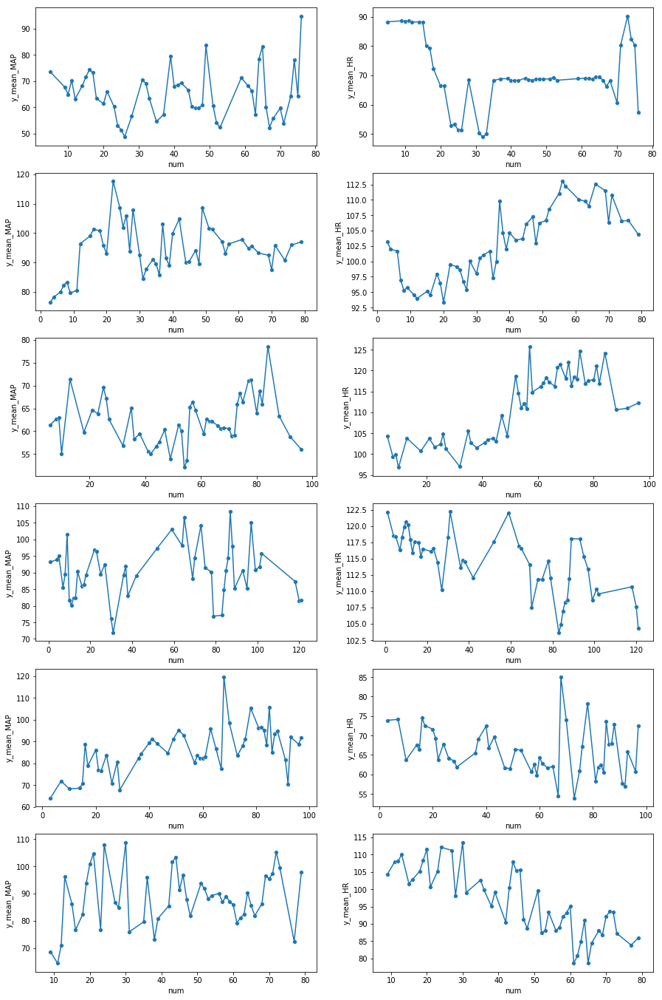

In [207]:
fig, ax = plt.subplots(nrows=len(patient_list), ncols=2,
                    sharex=False, sharey=False, figsize=(15,24))
for i in range(len(patient_list)):
    sns.lineplot(x='num', y='y_mean_MAP', 
                 data=train1[train1.patient_id == patient_list[i]], ax=ax[i][0])
#     sns.kdeplot(x='num', y='y_mean_MAP', 
#                  data=train1[train1.patient_id == patient_list[i]], ax=ax[i][0])
    sns.lineplot(x='num', y='y_mean_HR', 
                 data=train1[train1.patient_id == patient_list[i]], ax=ax[i][1])
    sns.scatterplot(x='num', y='y_mean_MAP', 
                    data=train1[train1.patient_id == patient_list[i]], ax=ax[i][0])
    sns.scatterplot(x='num', y='y_mean_HR', 
                    data=train1[train1.patient_id == patient_list[i]], ax=ax[i][1])
plt.show()

In [236]:
test1 = test.copy()
test1['num'] = test.key.str.split('-', expand=True).iloc[:,1]
test1['num'] = test1['num'].astype(int)

In [241]:
temp = test1.groupby('patient_id').agg({'num':['count', 'max']}).reset_index()
temp.columns = ['patient_id', 'count', 'max']
# temp

In [238]:
temp['count'] = temp['count']/30

In [240]:
temp['0'] = temp['count'] - temp['max']
temp['0'].value_counts()

0.0    558
Name: 0, dtype: int64

###  Big discover!  For the training set, all the keys are discrete, and for the test set, all the keys are continous.

In [56]:
# X_train, X_test, y_train, y_test = train_test_split(train_after.drop(columns = ['y_mean_MAP', 'y_mean_HR',
#                                                                                'patient_id', 'key', 'num']), 
#                                                     train_after[['y_mean_MAP', 'y_mean_HR']],
#                                                     test_size=0.25, random_state=42)

In [10]:
from sklearn.metrics import r2_score

train_data = lgb.Dataset(X_train, label = y_train['y_mean_MAP'], 
                         categorical_feature=['gender', 'x3', 'x4', 'x5', 'x6' ])
model = lgb.train(params = {'metric': 'MSE'} ,train_set = train_data)
r2_score(model.predict(X_train), y_train[['y_mean_MAP']])
r2_score(model.predict(X_test), y_test[['y_mean_MAP']])
# 
train_data = lgb.Dataset(X_train, label = y_train['y_mean_HR'], 
                         categorical_feature=['gender', 'x3', 'x4', 'x5', 'x6'])
model = lgb.train(params = {'metric': 'MSE'} ,train_set = train_data)
r2_score(model.predict(X_train), y_train[['y_mean_HR']])
r2_score(model.predict(X_test), y_test[['y_mean_HR']])

/anaconda3/lib/python3.7/site-packages/lightgbm/basic.py:1291: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


0.9207657862757734

0.8887446109977519

/anaconda3/lib/python3.7/site-packages/lightgbm/basic.py:1291: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


0.9656277319584894

0.9422291612028425

In [136]:
# temp3 = train2.groupby('patient_id').agg({'num':'max'}).reset_index()
# temp3.loc[temp3.num == 50]

In [135]:
# train2.loc[train2.patient_id.isin(temp3.loc[temp3.num == 50].patient_id)].\
# groupby('patient_id').count()

In [137]:
train2.head()

,patient_id,key,gender,age,x1,x2,x3,x4,x5,x6,y_mean_MAP,y_mean_HR,xx1|mean,xx1|min,xx1|max,xx1|std,xx2|mean,xx2|min,xx2|max,xx2|std,xx3|mean,xx3|min,xx3|max,xx3|std,xx4|mean,xx4|min,xx4|max,xx4|std,xx5|mean,xx5|min,xx5|max,xx5|std,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,count,num
0,1891,1891-3,1,75,22,1,2,0,0,1,59.04,80.00,79.436667,75.5,80.0,1.183648,97.886667,94.9,100.0,2.102008,107.596667,79.9,164.4,25.013410,54.140000,42.2,78.1,10.562608,68.863333,52.1,106.9,16.092245,80.0,95.0,99.9,49.4,62.5,80.0,94.9,98.4,48.7,61.3,80.0,95.0,95.3,48.5,60.3,80.0,95.0,97.4,48.9,61.3,76.7,95.7,99.6,50.2,62.8,79.1,97.9,100.9,50.5,63.9,80.0,100.0,104.2,53.9,67.2,80.0,99.6,97.9,50.9,63.1,78.2,99.8,106.7,54.2,68.5,77.4,100.0,111.9,56.4,70.9,77.4,100.0,101.8,51.5,64.3,80.0,99.0,94.7,48.1,60.0,80.0,97.7,91.7,46.6,57.9,78.8,96.7,88.3,45.1,56.2,75.5,95.5,82.5,42.3,52.3,80.0,94.9,81.0,42.2,52.1,80.0,95.0,80.9,42.4,52.4,80.0,95.2,82.2,43.7,53.8,80.0,96.7,95.1,50.2,62.0,80.0,98.5,118.7,59.8,75.9,80.0,99.9,140.3,68.1,89.1,80.0,100.0,154.2,73.8,98.6,80.0,100.0,161.2,76.9,104.0,80.0,100.0,164.4,78.1,106.9,80.0,100.0,155.6,73.2,100.0,80.0,100.0,132.3,64.6,84.5,80.0,100.0,122.4,60.9,78.0,80.0,99.5,101.8,52.6,65.2,80.0,98.3,86.7,47.2,56.9,80.0,96.8,79.9,45.3,54.0,10,3
1,1891,1891-7,1,75,22,1,2,0,0,1,83.88,79.98,80.000000,80.0,80.0,0.000000,100.000000,100.0,100.0,0.000000,128.220000,96.6,151.8,12.206849,54.963333,43.7,63.6,4.637812,75.096667,56.6,89.7,7.412035,80.0,100.0,127.1,53.6,74.3,80.0,100.0,119.9,50.2,68.3,80.0,100.0,123.1,51.7,70.7,80.0,100.0,121.9,51.6,70.2,80.0,100.0,123.9,52.6,72.1,80.0,100.0,123.1,52.4,71.4,80.0,100.0,121.2,51.2,69.9,80.0,100.0,121.1,51.4,69.8,80.0,100.0,123.0,52.5,71.7,80.0,100.0,123.7,52.5,72.0,80.0,100.0,121.1,52.4,71.0,80.0,100.0,121.0,51.5,70.4,80.0,100.0,123.7,53.1,72.6,80.0,100.0,123.0,54.6,73.2,80.0,100.0,102.4,47.0,60.7,80.0,100.0,96.6,43.7,56.6,80.0,100.0,118.3,52.8,70.1,80.0,100.0,129.9,57.6,77.1,80.0,100.0,135.5,59.3,80.3,80.0,100.0,138.0,59.5,81.8,80.0,100.0,132.1,58.3,78.8,80.0,100.0,133.7,57.2,78.8,80.0,100.0,140.0,60.4,83.0,80.0,100.0,137.4,58.9,81.0,80.0,100.0,141.3,59.5,82.8,80.0,100.0,139.7,58.2,81.0,80.0,100.0,142.0,60.3,83.7,80.0,100.0,143.6,59.5,83.4,80.0,100.0,147.5,61.8,86.5,80.0,100.0,151.8,63.6,89.7,10,7
2,1891,1891-8,1,75,22,1,2,0,0,1,82.04,80.34,80.000000,80.0,80.0,0.000000,99.693333,99.0,100.0,0.433059,130.940000,85.0,158.3,25.735493,57.703333,43.3,68.9,9.089649,76.056667,53.5,93.3,14.167439,80.0,100.0,151.2,65.8,88.4,80.0,100.0,154.0,66.6,90.1,80.0,100.0,155.8,67.7,91.5,80.0,100.0,158.2,68.9,93.3,80.0,100.0,157.4,68.1,92.3,80.0,100.0,157.9,68.0,92.4,80.0,100.0,158.3,68.3,92.7,80.0,100.0,152.5,65.0,87.5,80.0,100.0,155.2,66.1,89.2,80.0,100.0,153.6,65.4,88.3,80.0,100.0,155.5,66.1,89.4,80.0,100.0,151.6,64.6,86.5,80.0,100.0,150.6,64.3,86.5,80.0,100.0,149.0,63.1,84.6,80.0,100.0,134.4,57.5,75.7,80.0,99.6,121.6,53.6,69.1,80.0,99.2,118.1,52.1,67.3,80.0,100.0,129.5,56.7,74.2,80.0,100.0,138.8,59.5,78.5,80.0,100.0,130.5,56.1,73.1,80.0,99.9,125.1,53.5,69.8,80.0,99.0,105.6,48.0,61.2,80.0,99.0,103.5,47.1,60.2,80.0,99.0,103.7,47.6,60.6,80.0,99.7,99.7,47.1,59.3,80.0,99.0,96.0,45.7,57.5,80.0,99.0,95.3,46.2,58.1,80.0,99.0,85.0,43.5,53.8,80.0,99.0,85.9,43.3,53.5,80.0,99.4,94.7,45.6,57.1,10,8
3,1891,1891-9,1,75,22,1,2,0,0,1,87.18,80.00,80.003333,80.0,80.1,0.018257,99.883333,99.0,100.0,0.306350,154.186667,145.3,161.3,4.666294,59.740000,56.5,62.2,1.520118,84.913333,79.4,89.9,2.959582,80.0,99.0,152.9,60.7,84.7,80.0,99.0,150.0,59.0,82.4,80.0,99.2,149.5,58.7,82.1,80.0,99.3,148.0,57.8,

In [165]:
train2.loc[train2.patient_id == 723].sort_values(by = 'num')[mean_col[0]]

16078    103.480000
16079     99.296667
16080    115.230000
16081    115.826667
16082    118.733333
16083    117.850000
16084    116.133333
16085    117.346667
16086    106.856667
16087    105.700000
16088    100.230000
16089    102.583333
16090    102.510000
16091     99.683333
16092     99.080000
16093     93.853333
16094     85.453333
16095     84.583333
16096     88.936667
16097     95.673333
16098    108.036667
16099    109.230000
16100     99.666667
16101    100.400000
16102    102.543333
16103    106.263333
Name: xx1|mean, dtype: float64

In [ ]:
# plot all the patients in the test set with 50 unique keys with mean xx1 - xx5
col_list = ['xx1', 'xx2', 'xx3', 'xx4', 'xx5']
patiend_list = temp1.key.unique()
fig, ax = plt.subplots(nrows=len(patiend_list),
                       ncols=5, sharex=False, sharey=False, figsize=(100,600))
for i in range(len(patiend_list)):
    for j in range(5):
        series = temp1.loc[temp1.key == patiend_list[i]][col_list[j]]
        sns.scatterplot(range(len(series)), series.values, ax =ax[i][j])
        sns.lineplot(range(len(series)), series.values, ax =ax[i][j])  

In [168]:
# choose patients in the training set whose max key is 50 and the total observation is bigger than 25.
sample_patient = [723, 1146, 1184, 1339, 1604, 1782, 1789, 1811, 2370, 2484, 2637, 2725, 2737]

In [169]:
mean_col = ['xx1|mean', 'xx2|mean', 'xx3|mean', 
            'xx4|mean', 'xx5|mean', 'y_mean_MAP', 'y_mean_HR']

In [184]:
# # plot their mean_map, mean_HR and mean xx1 - xx5
# fig, ax = plt.subplots(nrows=len(sample_patient),
#                        ncols=7, sharex=False, sharey=False, figsize=(460, 230))

# for i in range(len(sample_patient)):
#     temp = train2.loc[train2.patient_id == sample_patient[i]].sort_values(by = 'num')
#     for col in range(len(mean_col)):
#         sns.scatterplot(range(len(temp)), temp[mean_col[col]].values, ax =ax[i][col])
#         sns.lineplot(range(len(temp)), temp[mean_col[col]].values, ax =ax[i][col])
#         ax[i][col].set_xlabel(str(sample_patient[i]) + mean_col[col]) # patient id
# fig.savefig('mean_col.pdf')

In [155]:
len(train2)

44949

In [183]:
# # plot their mean_map, mean_HR and day 1 xx1 - xx5
# day1_col = [0,1,2,3,4, 'y_mean_MAP', 'y_mean_HR']
# fig, ax = plt.subplots(nrows=len(sample_patient),
#                        ncols=7, sharex=False, sharey=False, figsize=(460, 230))

# for i in range(len(sample_patient)):
#     temp = train2.loc[train2.patient_id == sample_patient[i]].sort_values(by = 'num')
#     for col in range(len(day1_col)):
#         sns.scatterplot(range(len(temp)), temp[day1_col[col]], ax =ax[i][col])
#         sns.lineplot(range(len(temp)), temp[day1_col[col]], ax =ax[i][col])
#         plt.xlabel(str(sample_patient[i]) + str(day1_col[col]))
# fig.savefig('day1_col.pdf')

In [182]:
# # plot their mean_map, mean_HR and day 30 xx1 - xx5
# day30_col = [145, 146, 147, 148, 149, 'y_mean_MAP', 'y_mean_HR']
# fig, ax = plt.subplots(nrows=len(sample_patient),
#                        ncols=7, sharex=False, sharey=False, figsize=(460, 230))

# for i in range(len(sample_patient)):
#     temp = train2.loc[train2.patient_id == sample_patient[i]].sort_values(by = 'num')
#     for col in range(len(mean_col)):
#         sns.scatterplot(range(len(temp)), temp[day30_col[col]], ax =ax[i][col])
#         sns.lineplot(range(len(temp)), temp[day30_col[col]], ax =ax[i][col])
#         ax[i][col].set_xlabel(str(sample_patient[i]) + str(day30_col[col]))
# fig.savefig('day30_col.pdf')

In [180]:
len(train.patient_id.unique())

2321